In [1]:
#!for a in /sys/bus/pci/devices/*; do echo 0 | sudo tee -a $a/numa_node; done
import tensorflow as tf
import matplotlib.pyplot as plt
import os
from data_processing import dataset
from models import model
from utils import tools
from plots import plots, edge_detection_plots

os.environ['TF_FORCE_GPU_ALLOW_GROWTH'] = 'true'
#np.set_printoptions(threshold=sys.maxsize)

2022-12-30 14:27:25.357595: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-12-30 14:27:25.455640: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2022-12-30 14:27:25.477945: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2022-12-30 14:27:25.876134: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; 

In [2]:
config_directory = 'edge_detection_with_prior_segmentation'

config_path = os.path.join(os.getcwd(), 'configs', config_directory)
DataProcessing = dataset.DataProcessing(config_path=config_path)
Model = model.Model(config_path)
tools.parser(Model.cfg, DataProcessing.cfg)
Model.load_data(DataProcessing.cfg["NAME"])
DataProcessing.path_definitions()

2022-12-30 14:27:27.021559: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-12-30 14:27:27.025224: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-12-30 14:27:27.025318: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-12-30 14:27:27.025937: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the approp

# Load Dataset, Preprocess Images and Dataset

The TRAIN DS contains 1093 images.
The TEST DS contains 19 images.
The IMG_ONLY DS contains 10 images.


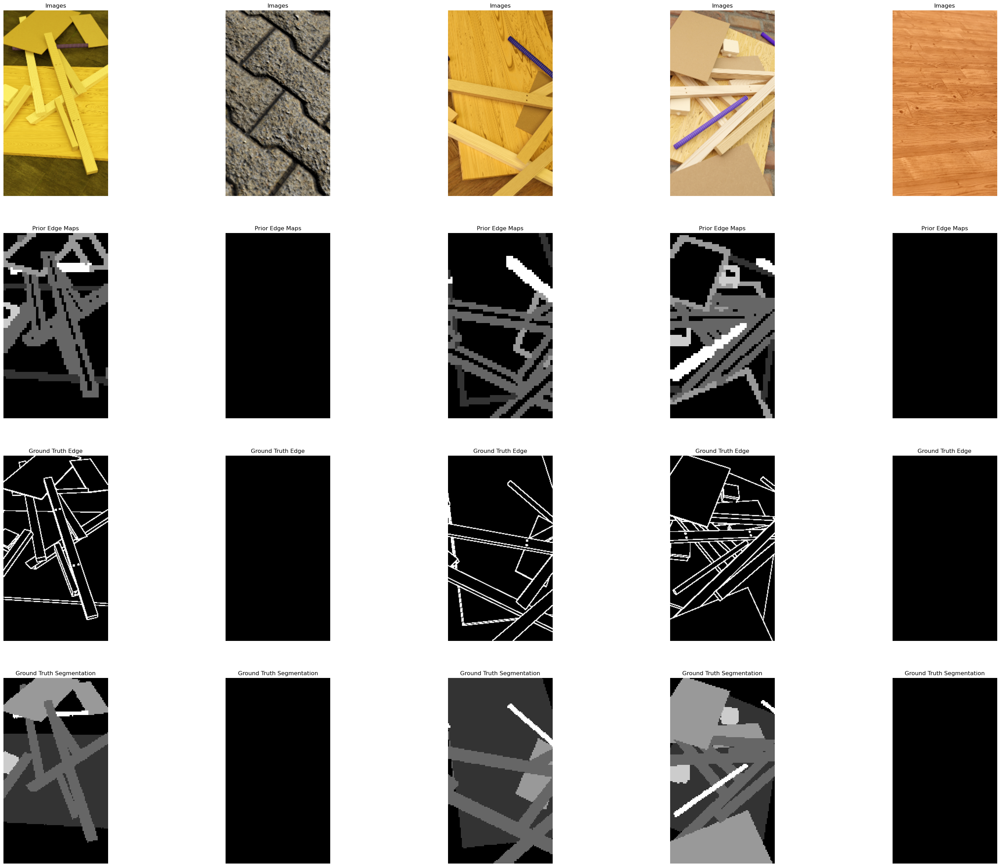

In [3]:
if Model.train_model:
    train_ds, img_count_train = DataProcessing.load_dataset(DataProcessing.key.train)
test_ds, img_count_test = DataProcessing.load_dataset(DataProcessing.key.test)

img_only_ds, img_count_img_only_ds = DataProcessing.load_dataset(DataProcessing.key.img_only)

if Model.train_model:
    for inp, out in train_ds.take(1):
        edge_detection_plots.plot_edges(images=inp['in_img'], 
                                        labels_segmentation=out['out_segmentation'],
                                        labels_edge=out['out_edge'],
                                        prior = inp['in_edge'],
                                        batch_size=DataProcessing.cfg['TEST']['BATCH_SIZE'])

# Define, Compile and Train Model

In [4]:
if Model.train_model:
    model = Model.get_neural_network_model(DataProcessing.input_data_cfg, DataProcessing.output_data_cfg)
    # model.summary()

    lr = Model.get_lr(img_count_train, DataProcessing.cfg['TRAIN']['BATCH_SIZE'])
    model.compile(optimizer=tf.keras.optimizers.Adam(lr),
                  loss=Model.get_loss_function(DataProcessing.output_data_cfg),
                  metrics=Model.get_metrics(DataProcessing.output_data_cfg))

    history = model.fit(train_ds, epochs=Model.cfg["EPOCHS"], validation_data=train_ds,
                        callbacks=Model.get_callbacks(), verbose=1)

model = Model.get_best_model_from_checkpoints()

Epoch 1/50


2022-12-30 14:27:42.054297: I tensorflow/stream_executor/cuda/cuda_blas.cc:1614] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.
2022-12-30 14:27:42.527791: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8100


219/219 [==============================] - 23s 83ms/step - loss: 5992.4771 - out_edge_loss: 3686.2837 - out_segmentation_loss: 2306.1946 - accuracy: 0.8357 - accuracy_edges_1: 0.9332 - f1_edges: 0.2064 - precision_edges: 0.3562 - recall_edges: 0.1551 - f1_edges_1: 0.2064 - precision_edges_1: 0.3562 - recall_edges_1: 0.1551 - accuracy_segmentation_1: 0.6755 - accuracy_segmentation_2: 0.8527 - accuracy_segmentation_3: 0.7833 - accuracy_segmentation_4: 0.9249 - accuracy_segmentation_5: 0.9423 - f1_segmentation: 0.3591 - precision_segmentation: 0.4043 - recall_segmentation: 0.3455 - f1_segmentation_1: 0.2776 - precision_segmentation_1: 0.3011 - recall_segmentation_1: 0.3053 - f1_segmentation_2: 0.5932 - precision_segmentation_2: 0.6618 - recall_segmentation_2: 0.5403 - f1_segmentation_3: 0.2581 - precision_segmentation_3: 0.3550 - recall_segmentation_3: 0.2192 - f1_segmentation_4: 0.0606 - precision_segmentation_4: 0.0601 - recall_segmentation_4: 0.0785 - f1_segmentation_5: 0.0516 - precis

Epoch 5/50
219/219 [==============================] - 17s 77ms/step - loss: 3435.4929 - out_edge_loss: 2164.8079 - out_segmentation_loss: 1270.6859 - accuracy: 0.9382 - accuracy_edges_1: 0.9655 - f1_edges: 0.7350 - precision_edges: 0.7185 - recall_edges: 0.7523 - f1_edges_1: 0.7350 - precision_edges_1: 0.7185 - recall_edges_1: 0.7523 - accuracy_segmentation_1: 0.8461 - accuracy_segmentation_2: 0.9334 - accuracy_segmentation_3: 0.9309 - accuracy_segmentation_4: 0.9883 - accuracy_segmentation_5: 0.9925 - f1_segmentation: 0.7549 - precision_segmentation: 0.7870 - recall_segmentation: 0.7255 - f1_segmentation_1: 0.6637 - precision_segmentation_1: 0.6927 - recall_segmentation_1: 0.6387 - f1_segmentation_2: 0.8409 - precision_segmentation_2: 0.8820 - recall_segmentation_2: 0.8036 - f1_segmentation_3: 0.7772 - precision_segmentation_3: 0.7991 - recall_segmentation_3: 0.7568 - f1_segmentation_4: 0.7178 - precision_segmentation_4: 0.7922 - recall_segmentation_4: 0.6566 - f1_segmentation_5: 0.76

Epoch 9/50
219/219 [==============================] - 17s 78ms/step - loss: 3032.2087 - out_edge_loss: 1954.5471 - out_segmentation_loss: 1077.6613 - accuracy: 0.9463 - accuracy_edges_1: 0.9690 - f1_edges: 0.7657 - precision_edges: 0.7461 - recall_edges: 0.7864 - f1_edges_1: 0.7657 - precision_edges_1: 0.7461 - recall_edges_1: 0.7864 - accuracy_segmentation_1: 0.8647 - accuracy_segmentation_2: 0.9458 - accuracy_segmentation_3: 0.9343 - accuracy_segmentation_4: 0.9918 - accuracy_segmentation_5: 0.9947 - f1_segmentation: 0.7915 - precision_segmentation: 0.8205 - recall_segmentation: 0.7647 - f1_segmentation_1: 0.7059 - precision_segmentation_1: 0.7382 - recall_segmentation_1: 0.6776 - f1_segmentation_2: 0.8719 - precision_segmentation_2: 0.8998 - recall_segmentation_2: 0.8457 - f1_segmentation_3: 0.8041 - precision_segmentation_3: 0.8257 - recall_segmentation_3: 0.7837 - f1_segmentation_4: 0.7965 - precision_segmentation_4: 0.8611 - recall_segmentation_4: 0.7411 - f1_segmentation_5: 0.81

INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/edge_detection_with_prior_segmentation/CKPT/ckpt-loss=3091.52-epoch=10.00-f1=0.7483/assets


INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/edge_detection_with_prior_segmentation/CKPT/ckpt-loss=3091.52-epoch=10.00-f1=0.7483/assets


219/219 [==============================] - 22s 102ms/step - loss: 2919.6982 - out_edge_loss: 1905.4095 - out_segmentation_loss: 1014.2895 - accuracy: 0.9497 - accuracy_edges_1: 0.9707 - f1_edges: 0.7709 - precision_edges: 0.7479 - recall_edges: 0.7954 - f1_edges_1: 0.7709 - precision_edges_1: 0.7479 - recall_edges_1: 0.7954 - accuracy_segmentation_1: 0.8753 - accuracy_segmentation_2: 0.9515 - accuracy_segmentation_3: 0.9359 - accuracy_segmentation_4: 0.9903 - accuracy_segmentation_5: 0.9954 - f1_segmentation: 0.8035 - precision_segmentation: 0.8306 - recall_segmentation: 0.7783 - f1_segmentation_1: 0.7282 - precision_segmentation_1: 0.7718 - recall_segmentation_1: 0.6913 - f1_segmentation_2: 0.8841 - precision_segmentation_2: 0.9060 - recall_segmentation_2: 0.8634 - f1_segmentation_3: 0.8052 - precision_segmentation_3: 0.8121 - recall_segmentation_3: 0.7989 - f1_segmentation_4: 0.7659 - precision_segmentation_4: 0.8333 - recall_segmentation_4: 0.7091 - f1_segmentation_5: 0.8466 - preci

Epoch 14/50
219/219 [==============================] - 17s 79ms/step - loss: 2745.5281 - out_edge_loss: 1820.8931 - out_segmentation_loss: 924.6355 - accuracy: 0.9558 - accuracy_edges_1: 0.9704 - f1_edges: 0.7828 - precision_edges: 0.7594 - recall_edges: 0.8078 - f1_edges_1: 0.7828 - precision_edges_1: 0.7594 - recall_edges_1: 0.8078 - accuracy_segmentation_1: 0.8929 - accuracy_segmentation_2: 0.9542 - accuracy_segmentation_3: 0.9471 - accuracy_segmentation_4: 0.9896 - accuracy_segmentation_5: 0.9952 - f1_segmentation: 0.8351 - precision_segmentation: 0.8547 - recall_segmentation: 0.8165 - f1_segmentation_1: 0.7844 - precision_segmentation_1: 0.8048 - recall_segmentation_1: 0.7655 - f1_segmentation_2: 0.8961 - precision_segmentation_2: 0.9117 - recall_segmentation_2: 0.8810 - f1_segmentation_3: 0.8376 - precision_segmentation_3: 0.8597 - recall_segmentation_3: 0.8169 - f1_segmentation_4: 0.7679 - precision_segmentation_4: 0.8107 - recall_segmentation_4: 0.7348 - f1_segmentation_5: 0.85

Epoch 18/50
219/219 [==============================] - 18s 81ms/step - loss: 2609.1489 - out_edge_loss: 1764.8674 - out_segmentation_loss: 844.2814 - accuracy: 0.9592 - accuracy_edges_1: 0.9718 - f1_edges: 0.7850 - precision_edges: 0.7602 - recall_edges: 0.8116 - f1_edges_1: 0.7850 - precision_edges_1: 0.7602 - recall_edges_1: 0.8116 - accuracy_segmentation_1: 0.8996 - accuracy_segmentation_2: 0.9561 - accuracy_segmentation_3: 0.9515 - accuracy_segmentation_4: 0.9925 - accuracy_segmentation_5: 0.9961 - f1_segmentation: 0.8452 - precision_segmentation: 0.8667 - recall_segmentation: 0.8248 - f1_segmentation_1: 0.7870 - precision_segmentation_1: 0.8198 - recall_segmentation_1: 0.7576 - f1_segmentation_2: 0.9009 - precision_segmentation_2: 0.9183 - recall_segmentation_2: 0.8844 - f1_segmentation_3: 0.8524 - precision_segmentation_3: 0.8553 - recall_segmentation_3: 0.8500 - f1_segmentation_4: 0.8152 - precision_segmentation_4: 0.8958 - recall_segmentation_4: 0.7484 - f1_segmentation_5: 0.88

KeyboardInterrupt: 

In [5]:
model.summary()


tf.keras.utils.plot_model(
    model,
    to_file=Model.Data.paths['FIGURES']+"/model.png",
    show_shapes=True,
    show_dtype=False,
    show_layer_names=True,
    rankdir='TB',
    expand_nested=False,
    dpi=96,
    layer_range=None,
    show_layer_activations=True
)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 in_img (InputLayer)            [(None, 320, 180, 3  0           []                               
                                )]                                                                
                                                                                                  
 depthwise_conv2d (DepthwiseCon  (None, 320, 180, 3)  78         ['in_img[0][0]']                 
 v2D)                                                                                             
                                                                                                  
 tf.__operators__.add (TFOpLamb  (None, 320, 180, 3)  0          ['depthwise_conv2d[0][0]']       
 da)                                                                                          

 separable_conv2d_1 (SeparableC  (None, 80, 45, 5)   75          ['in_edge[0][0]']                
 onv2D)                                                                                           
                                                                                                  
 batch_normalization_11 (BatchN  (None, 80, 45, 48)  192         ['conv2d_8[0][0]']               
 ormalization)                                                                                    
                                                                                                  
 batch_normalization_7 (BatchNo  (None, 80, 45, 5)   20          ['separable_conv2d_1[0][0]']     
 rmalization)                                                                                     
                                                                                                  
 depthwise_conv2d_2 (DepthwiseC  (None, 80, 45, 48)  480         ['batch_normalization_11[0][0]'] 
 onv2D)   

                                                                                                  
 batch_normalization_20 (BatchN  (None, 80, 45, 10)  40          ['separable_conv2d_7[0][0]']     
 ormalization)                                                                                    
                                                                                                  
 batch_normalization_24 (BatchN  (None, 160, 90, 6)  24          ['separable_conv2d_9[0][0]']     
 ormalization)                                                                                    
                                                                                                  
 separable_conv2d_5 (SeparableC  (None, 80, 45, 12)  264         ['tf.math.multiply_2[0][0]']     
 onv2D)                                                                                           
                                                                                                  
 batch_nor

Total params: 25,146
Trainable params: 24,024
Non-trainable params: 1,122
__________________________________________________________________________________________________
You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


# Plot Results

In [6]:
if Model.train_model:
    plot_losses = ["loss", "loss"]
    plot_metrics = ["accuracy", "f1", "recall", "precision"]

    path = os.path.join(Model.Data.paths["FIGURES"], "training")

    plots.plot_training_history(history=history.history, list_of_loss_names=plot_losses,
                                list_of_metric_names=plot_metrics,
                                save=Model.cfg["SAVE"], path=path)

NameError: name 'history' is not defined

1/1 [==============================] - 0s 363ms/step


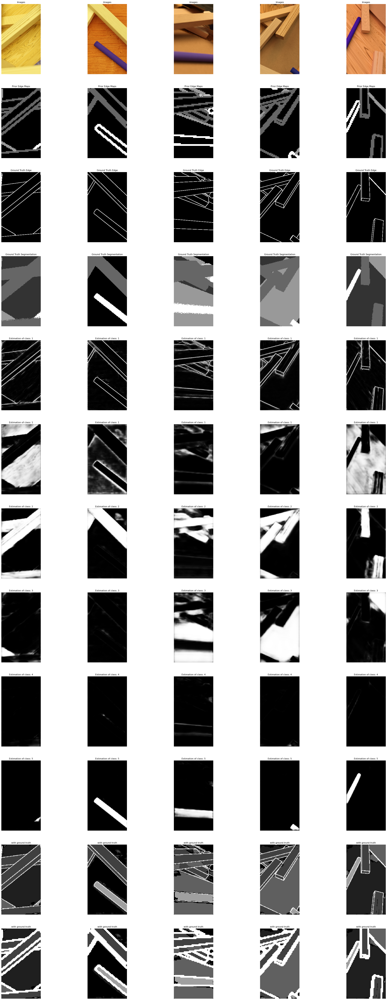

1/1 [==============================] - 0s 20ms/step


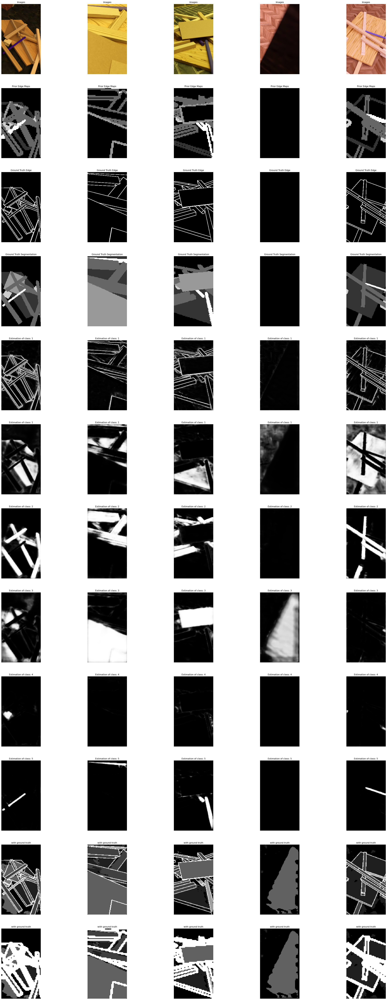

1/1 [==============================] - 0s 18ms/step


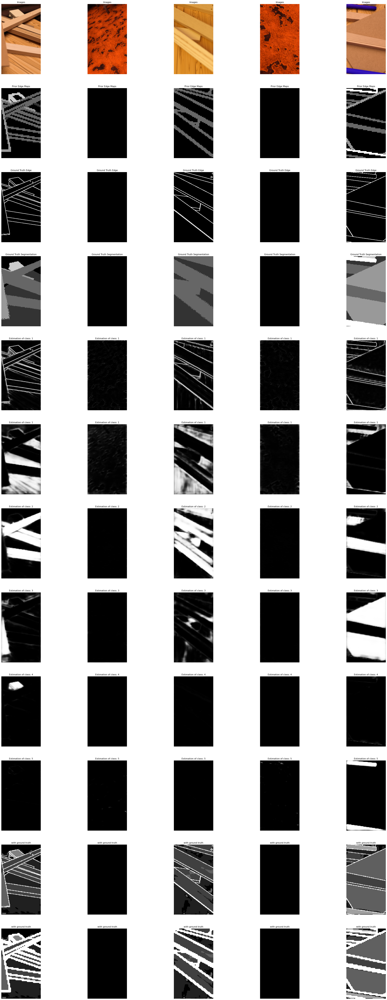

In [5]:
i = 0
for inp, out in test_ds.take(3):
    pred = model.predict(inp)
    path = os.path.join(Model.Data.paths["FIGURES"], "prediction_{}".format(i))
    edge_detection_plots.plot_edges(images=inp['in_img'],
                                    prior = inp['in_edge'],
                                    labels_segmentation=out['out_segmentation'],
                                    labels_edge=out['out_edge'],
                                    predictions_edge=pred[0],
                                    predictions_segmentation=pred[1],
                                    batch_size=DataProcessing.cfg['TEST']['BATCH_SIZE'])
    i += 1

1/1 [==============================] - 0s 17ms/step


TypeError: unsupported operand type(s) for *: 'NoneType' and 'int'

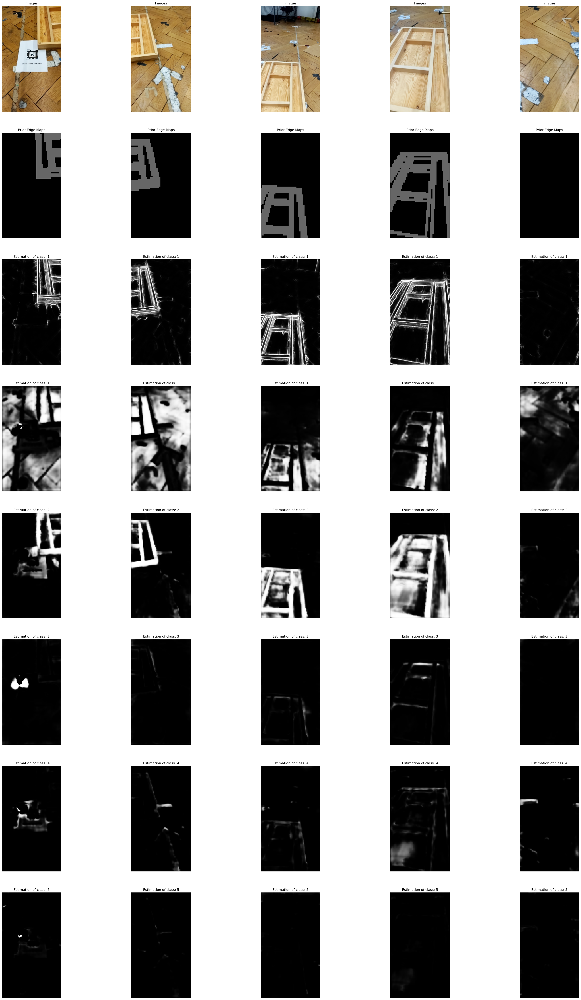

In [8]:
i = 0
for inp, out in img_only_ds.take(1):
    pred = model.predict(inp)
    path = os.path.join(Model.Data.paths["FIGURES"], "prediction_{}".format(i))
    edge_detection_plots.plot_edges(images=inp['in_img'],
                                    prior = inp['in_edge'],
                                    predictions_edge=pred[0],
                                    predictions_segmentation=pred[1],
                                    batch_size=DataProcessing.cfg['TEST']['BATCH_SIZE'],
                                   save=Model.cfg["SAVE"], path=path)
    i += 1

1/1 [==============================] - 0s 17ms/step


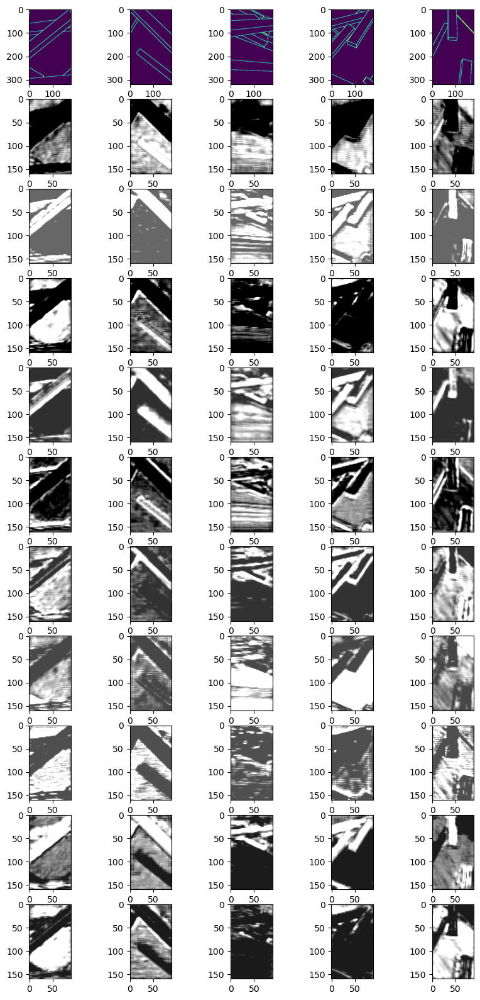

1/1 [==============================] - 0s 21ms/step


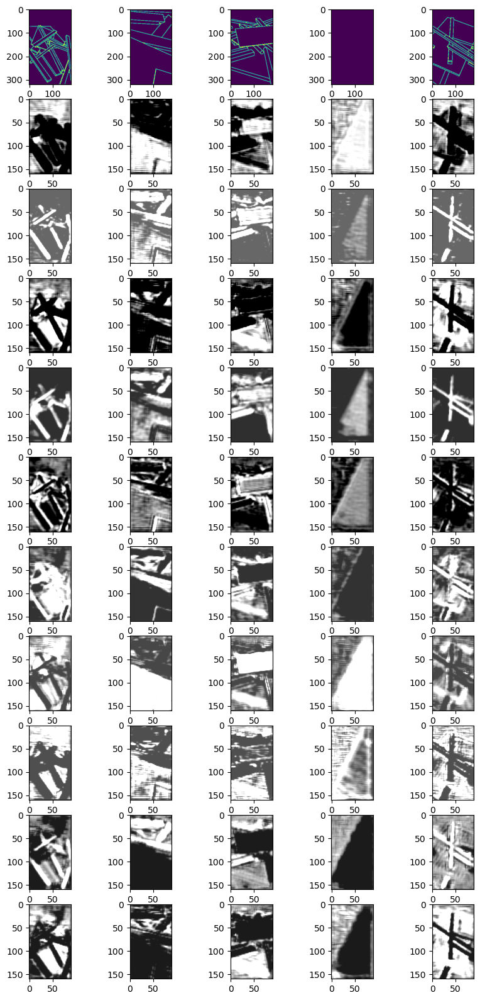

In [8]:
k = 0
output =4 # pyramid_out
num = 10
batch = 5
for inp, out in test_ds.take(2):
    plt.figure(figsize=(10,20))
    pred = model.predict(inp)
    out_pred = pred[output]
    for i in range(batch):
        plt.subplot(num+1, batch, i + 1)
        plt.imshow((out["out_edge"][i,:,:,0]))
        for j in range(num):
            plt.subplot(num+1, batch, batch*(1+j) + i + 1)
            plt.imshow(out_pred[i,:,:,j], cmap='gray', vmin=-1, vmax=1)
    path = os.path.join(Model.Data.paths["FIGURES"], "pyramid_out_{}".format(k))
    plt.savefig(path + ".svg", bbox_inches='tight')
    plt.show()
    k = k+1

In [ ]:
k = 0
output = 3 # edge_layer
num = 6
batch = 5
for inp, out in test_ds.take(2):
    plt.figure(figsize=(5,10))
    pred = model.predict(inp)
    out_pred = pred[output]
    for i in range(batch):
        plt.subplot(num+1, batch, i + 1)
        plt.imshow((out["out_edge"][i,:,:,0]))
        for j in range(num):
            plt.subplot(num+1, batch, batch*(1+j) + i + 1)
            plt.imshow(out_pred[i,:,:,j], cmap='gray', vmin=0, vmax=1)
    path = os.path.join(Model.Data.paths["FIGURES"], "side_1_{}".format(k))
    plt.savefig(path + ".svg", bbox_inches='tight')
    plt.show()
    k += 1

In [ ]:
k = 0
output = 2 # image_pyramid_in
num = 12
batch = 5
for inp, out in test_ds.take(2):
    plt.figure(figsize=(5,10))
    pred = model.predict(inp)
    out_pred = pred[output]
    for i in range(batch):
        plt.subplot(num+1, batch, i + 1)
        plt.imshow((out["out_edge"][i,:,:,0]))
        for j in range(num):
            plt.subplot(num+1, batch, batch*(1+j) + i + 1)
            plt.imshow(out_pred[i,:,:,j], cmap='gray', vmin=-1, vmax=1)
    path = os.path.join(Model.Data.paths["FIGURES"], "side_2_{}".format(k))
    plt.savefig(path + ".svg", bbox_inches='tight')
    plt.show()
    k += 1

In [ ]:
### Maximum F1 Score:
path_metrics_evaluation_plot = os.path.join(Model.Data.paths["FIGURES"],
                                            "threshold_metrics_evaluation_test_ds.svg")

edge_detection_plots.plot_threshold_metrics_evaluation(model=model, ds=test_ds,
                                                       num_classes=DataProcessing
                                                       .output_data_cfg["edge"]["num_classes"],
                                                       classes_displayed_individually=True,
                                                       save=Model.cfg["SAVE"],
                                                       path=path_metrics_evaluation_plot,
                                                       accuracy_y_lim_min=0.8)


In [ ]:
if Model.cfg["CONVERT_TO_TFLITE"]:
    Model.convert_model_to_tflite(model)

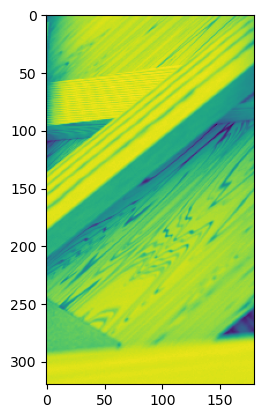

In [17]:
for inp, out in test_ds.take(1):
    x = tf.image.rgb_to_hsv((inp["in_img"]+1)*127.5)
    plt.imshow(x[0,:,:,2])
    